# Inference Notebook CVAE
The inference notebook is used for any experiments doe outside of the Training, All training are done using the python scripts.

The inference code includes all the Pyro implementations for the Unsupervised VAE. The models are called and the inference are made. This Ipython notebook can be used to generate the sample of sources as well as post analysis of the generated images.

In [1]:
import os
import pandas as pd
import numpy as np
import torch
import torchvision.datasets as dset
import torch.nn as nn
import torchvision.transforms as transforms
import torch.nn.functional as F
import pyro
import pyro.distributions as dist
from pyro.infer import SVI, Trace_ELBO
from pyro.optim import Adam,Adagrad
import pyro.poutine as poutine
from torchvision.utils import save_image

import matplotlib.pylab as plt

from PIL import Image # Module for image rotation (making use of PIL)

from utils.models import HMT

In [2]:
from numpy import asarray
from numpy import expand_dims
from numpy import log
from numpy import mean
from numpy import exp

In [3]:
pyro.enable_validation(True)
pyro.distributions.enable_validation(False)
pyro.set_rng_seed(0)
# Enable smoke test - run the notebook cells on CI.
smoke_test = 'CI' in os.environ

In [4]:
#from utils.MiraBest import MiraBest
from utils.MiraBest_full import MiraBest_full
from utils.FRDEEP import FRDEEPF
from utils.data_downloader import dataloader_first_FRDEEP
from utils.data_downloader import dataloader_first
from utils.classification_function import classfication_procedure

In [5]:
#import network_configurations.neural_net_conf_0_2 as network #change this here to change configuration

import network_configurations.neural_net_conf_0_1_dropout as network1


In [6]:
def inception_score():
    model = HMT().cuda()
    model.load_state_dict(torch.load('model.mod'))
    
    return model.eval()

In [7]:
inception_classifier = inception_score()

In [8]:
def calculate_inception_score(p_yx, eps=1E-16):
	# calculate p(y)
	p_y = expand_dims(p_yx.mean(axis=0), 0)
	# kl divergence for each image
	kl_d = p_yx * (log(p_yx + eps) - log(p_y + eps))
	# sum over classes
	sum_kl_d = kl_d.sum(axis=1)
	# average over images
	avg_kl_d = mean(sum_kl_d)
	# undo the logs
	is_score = exp(avg_kl_d)
	return is_score

In [9]:
class VAE(nn.Module):
    # by default our latent space is 50-dimensional
    # @David We have changed the latent space to 2-dimensional
    # and we use 400 hidden units
    def __init__(self, x_dim,h_dim1, h_dim2, h_dim3, h_dim4, h_dim5, y_dim, z_dim, use_cuda=True): # z_dim has been changed to 2
        super(VAE, self).__init__()
        # create the encoder and decoder networks
        #For the first images add addition hidden layers
        
        self.encoder_z = network1.EncoderZ(x_dim, h_dim1, h_dim2, h_dim3, h_dim4, h_dim5, y_dim, z_dim)
        
        self.decoder = network1.Decoder(x_dim, h_dim1, h_dim2, h_dim3, h_dim4, h_dim5, y_dim, z_dim)

        if use_cuda:
            # calling cuda() here will put all the parameters of
            # the encoder and decoder networks into gpu memory
            self.cuda()
            
            
        self.use_cuda = use_cuda
        self.z_dim = z_dim
                
    # define the model p(x|z)p(z)
    def model(self, xs, ys):
        # register this pytorch module and all of its sub-modules with pyro
        pyro.module("ss_vae", self)
        batch_size = xs.size(0)
        

        output_size = 2
        
        
        
        # inform Pyro that the variables in the batch of xs, ys are conditionally independent
        with pyro.plate("data"):
          
            # sample the handwriting style from the constant prior distribution
            prior_loc = xs.new_zeros([batch_size, self.z_dim])
            prior_scale = xs.new_ones([batch_size, self.z_dim])
            zs = pyro.sample("z", dist.Normal(prior_loc, prior_scale).to_event(1))

            # if the label y (which digit to write) is supervised, sample from the
            # constant prior, otherwise, observe the value (i.e. score it against the constant prior)
            alpha_prior = xs.new_ones([batch_size, output_size]) / (1.0 * output_size)
            ys = pyro.sample("y", dist.OneHotCategorical(alpha_prior), obs=ys)
            
            # finally, score the image (x) using the handwriting style (z) and
            # the class label y (which digit to write) against the
            # parametrized distribution p(x|y,z) = bernoulli(decoder(y,z))
            # where `decoder` is a neural network
            loc = self.decoder.forward([zs, ys])
            pyro.sample("x", dist.Bernoulli(loc).to_event(1), obs=xs)
            
    def guide(self, xs, ys):
        with pyro.plate("data"):
           # if the class label (the digit) is not supervised, sample
           # (and score) the digit with the variational distribution
           # q(y|x) = categorical(alpha(x))
           
            #-------------------REMOVED THIS PART FOR THE CLASSIFIER ASSUME ALL DATA ARE LABELLED---------

           # sample (and score) the latent handwriting-style with the variational
           # distribution q(z|x,y) = normal(loc(x,y),scale(x,y))
            loc, scale = self.encoder_z.forward([xs, ys])
            pyro.sample("z", dist.Normal(loc, scale).to_event(1))

    # define a helper function for reconstructing images
    def reconstruct_img(self, xs, ys):
        # encode image x
        z_loc, z_scale = self.encoder_z.forward([xs,ys])
        # sample in latent space
        z = dist.Normal(z_loc, z_scale).sample()
        # decode the image (note we don't sample in image space)
        loc_img = self.decoder.forward([zs,ys])
        
        return loc_img

In [10]:
# To do evaluate part afterwards
def evaluate(svi, test_loader, use_cuda=True):
    # initialize loss accumulator
    test_loss = 0.
    # compute the loss over the entire test set
    for x,y in test_loader:
        # if on GPU put mini-batch into CUDA memory
        if use_cuda:
            x = x.cuda()
        # compute ELBO estimate and accumulate loss
        test_loss += svi.evaluate_loss(x) #Data entry point <---------------------------------Data Entry Point
    normalizer_test = len(test_loader.dataset)
    total_epoch_loss_test = test_loss / normalizer_test
    return total_epoch_loss_test

# Recalls FRDEEP images

In [11]:
x = np.load('0_FIRST_IMAGE_NUMPY_x.np.npy')
y = np.load('0_FIRST_IMAGE_NUMPY_y.np.npy')

In [12]:
def inference_function(latent_dimension,weights_dir,epoch):
    data = np.zeros((5,4000)).T

    columns = ['Epoch','Train_Loss', 'Test_Loss', 'Sigma_clipped','Inception_score']
    df = pd.DataFrame(data, columns=columns)
    #ForNetwork without dropout use 0.0013

    # Run options
    LEARNING_RATE = 0.00125
    USE_CUDA = True

    # Run only for a single iteration for testing
    NUM_EPOCHS = 1 if smoke_test else 6000
    TEST_FREQUENCY = 5

    # Core Training section
    #-----------------------------------------------Main VAE Section--------------------------------------------


    # clear param store


    # setup the VAE
    vae = VAE(x_dim=10000,h_dim1=4096,h_dim2=2048,h_dim3=1024,h_dim4=512,h_dim5=256,y_dim=2,z_dim=latent_dimension,use_cuda=USE_CUDA)

    # setup the optimizer
    adam_args = {"lr": LEARNING_RATE}
    # optimizer = Adam(adam_args)   # The Adam optimizer is used as optimizer
    optimizer = Adagrad(adam_args)
    # setup the inference algorithm
    svi = SVI(vae.model, vae.guide, optimizer, loss=Trace_ELBO())
    #svi = SVI(vae.model, vae.guide, optimizer, loss=simple_elbo)
    #svi = SVI(vae.model, vae.guide, optimizer, loss=simple_elbo_kl_annealing)

    #svi.step(annealing_factor=0.2, latents_to_anneal=["my_latent"])
    
    #print("loading model from ...")
    vae.load_state_dict(torch.load('/raid/scratch/davidb/1_DEVELOPMENT/VAE_FIRST/MODELS/'+weights_dir+'/model_unsup_main_'+str(epoch)+'.mod'))
   # print("loading optimizer states from ...")
    optimizer.load('/raid/scratch/davidb/1_DEVELOPMENT/VAE_FIRST/MODELS/'+weights_dir+'/model_unsup_main_'+str(epoch)+'_opt.opt')
   # print("done loading model and optimizer states.")
    
    return vae

In [13]:
def inception_scoring():
    z_fr = torch.randn(100, 2)

    for i in range (0,100):
        z_fr[i,0] = np.random.uniform(-4,4)
        z_fr[i,1] = np.random.uniform(-4,4)
    
    sample1 = vae.decoder(z_fr.cuda()).cpu().detach().numpy().reshape(100,1,100,100)
    
    fullsize_image = np.zeros((100,1,150,150))

    for i in range (0,100):
        fullsize_image[i,0,25:125,25:125]=sample1[i,0,:,:]
    
    array_generated= torch.from_numpy(fullsize_image).float().to("cpu")

    valid_pred = inception_classifier(array_generated.cuda())
    m = nn.Softmax(dim=1)
    values=m(valid_pred).cpu().detach().numpy()
    score = calculate_inception_score(values)

    return score

In [15]:


d = 2

cvae_2 = inference_function(d,'SUP-MODELS-d2-0-0009000000000000011-2020-08-22',4550)
i = 405
image_torec = x[i][0][25:125,25:125]

labels_y = torch.tensor(np.zeros((y.shape[0],2)))

y_torch=torch.from_numpy(y).float().to("cuda:0")

y_2=torch.Tensor.cpu(y_torch.reshape(1,y_torch.size()[0])[0]).numpy().astype(int)  

labels_y=np.eye(2)[y_2]
labels_y = torch.from_numpy(labels_y)

to_rec = image_torec.reshape(10000)
to_rec_torch=torch.from_numpy(to_rec).float().to("cuda:0")

y_torch_real = labels_y[i].reshape(1,2)

y_torch_lab_1=labels_y[4].reshape(1,2)

y_torch_lab_2=labels_y[5].reshape(1,2)

[z_mean,z_sig]=cvae_2.encoder_z([to_rec_torch,y_torch_real.float().cuda()])

x_torch_1=cvae_2.decoder([z_mean,y_torch_lab_1.float().cuda()])
x_torch_2=cvae_2.decoder([z_mean,y_torch_lab_2.float().cuda()])


printed_count:1
2
SUP-MODELS-d2-0-0009000000000000011-2020-08-22
4950
printed_count:2
4
SUP-MODELS-d4-0-0010800000000000015-2020-08-25
4950
printed_count:3
8
SUP-MODELS-d8-0-0009000000000000011-2020-08-23
4950
printed_count:1
2
SUP-MODELS-d2-0-0009000000000000011-2020-08-22
4950
printed_count:2
4
SUP-MODELS-d4-0-0010800000000000015-2020-08-25
4950
printed_count:3
8
SUP-MODELS-d8-0-0009000000000000011-2020-08-23
4950
printed_count:1
2
SUP-MODELS-d2-0-0009000000000000011-2020-08-22
4950
printed_count:2
4
SUP-MODELS-d4-0-0010800000000000015-2020-08-25
4950
printed_count:3
8
SUP-MODELS-d8-0-0009000000000000011-2020-08-23
4950
printed_count:1
2
SUP-MODELS-d2-0-0009000000000000011-2020-08-22
4950
printed_count:2
4
SUP-MODELS-d4-0-0010800000000000015-2020-08-25
4950
printed_count:3
8
SUP-MODELS-d8-0-0009000000000000011-2020-08-23
4950
printed_count:1
2
SUP-MODELS-d2-0-0009000000000000011-2020-08-22
4950
printed_count:2
4
SUP-MODELS-d4-0-0010800000000000015-2020-08-25
4950
printed_count:3
8
SU

<Figure size 432x288 with 0 Axes>

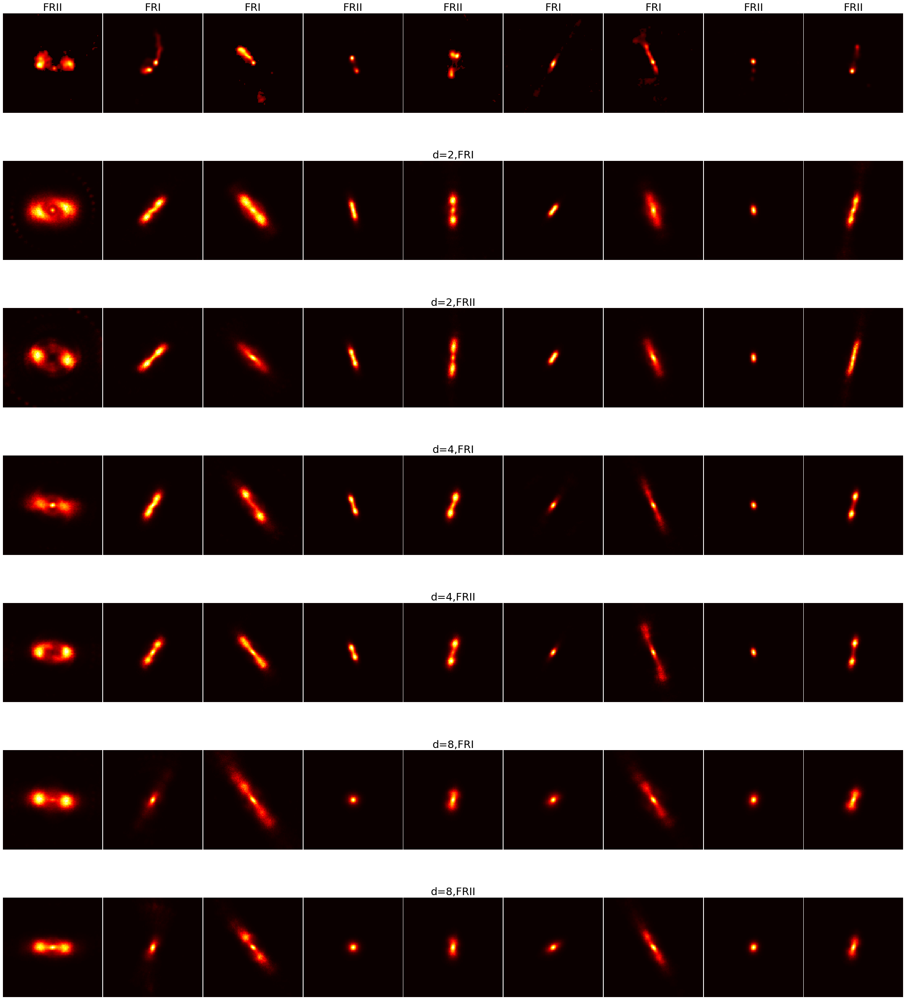

In [21]:
import matplotlib.pyplot as plt
import numpy as np

plt.figure(0)
plt.figure(figsize=(30,35))
plots = []
images = [400,403,302,202,6,60,62,67,86]
bluring_kernel = [1,5,9,13,17]
epoch = [100,200,400,800,1600,3200,5000]

directory_list=[0,'SUP-MODELS-d2-0-0009000000000000011-2020-08-22','SUP-MODELS-d4-0-0010800000000000015-2020-08-25','SUP-MODELS-d8-0-0009000000000000011-2020-08-23']
epoch_list=[0,4950,4950,4950]
latent_dimensions_loop = [0,2,4,8]


for i in range(9):
    count = 0
    count_pos = 0
    image_torec = x[images[i]][0][25:125,25:125]
    for weight_out in directory_list:
            
            if weight_out == 0:
                ax = plt.subplot2grid((7,9), (count,i))
                ax.imshow(image_torec,cmap='hot')
                ax.set_axis_off()
                count = count+1
                count_pos = count_pos + 1
            else:
                print('printed_count:'+str(count))
                print(latent_dimensions_loop[count])
                print(weight_out)
                print(epoch_list[count])
                cvae_2 = inference_function(latent_dimensions_loop[count],weight_out,epoch_list[count])


                labels_y = torch.tensor(np.zeros((y.shape[0],2)))

                y_torch=torch.from_numpy(y).float().to("cuda:0")

                y_2=torch.Tensor.cpu(y_torch.reshape(1,y_torch.size()[0])[0]).numpy().astype(int)  

                labels_y=np.eye(2)[y_2]
                labels_y = torch.from_numpy(labels_y)

                to_rec = image_torec.reshape(10000)
                to_rec_torch=torch.from_numpy(to_rec).float().to("cuda:0")

                y_torch_real = labels_y[images[i]].reshape(1,2)

                y_torch_lab_1=labels_y[4].reshape(1,2)

                y_torch_lab_2=labels_y[5].reshape(1,2)

                [z_mean,z_sig]=cvae_2.encoder_z([to_rec_torch,y_torch_real.float().cuda()])

                x_torch_1=cvae_2.decoder([z_mean,y_torch_lab_1.float().cuda()])
                x_torch_2=cvae_2.decoder([z_mean,y_torch_lab_2.float().cuda()])

                ax = plt.subplot2grid((7,9), (count_pos,i))
                ax.imshow(x_torch_1.reshape(100,100).cpu().detach().numpy(),cmap='hot')
                ax.set_axis_off()
                count_pos = count_pos + 1
                if i == 4:
                    ax.set_title('d='+str(latent_dimensions_loop[count])+',FRI',fontsize= 25)

                ax = plt.subplot2grid((7,9), (count_pos,i))
                ax.imshow(x_torch_2.reshape(100,100).cpu().detach().numpy(),cmap='hot')
                ax.set_axis_off()
                if i == 4:
                    ax.set_title('d='+str(latent_dimensions_loop[count])+',FRII',fontsize= 25)
                count = count + 1
                count_pos = count_pos + 1
            
            if i == 0:
                if weight_out == 0 :
                    ax.set_title('FRII',fontsize= 25)
                    ax.set_ylabel('test')
            
            if i == 1:
                if weight_out == 0 :
                    ax.set_title('FRI',fontsize= 25)
            
            if i == 2:
                if weight_out == 0 :
                    ax.set_title('FRI',fontsize= 25)
            
            if i == 3:
                if weight_out == 0 :
                    ax.set_title('FRII',fontsize= 25)
            if i == 4:
                if weight_out == 0 :
                    ax.set_title('FRII',fontsize= 25)
            if i == 5:
                if weight_out == 0 :
                    ax.set_title('FRI',fontsize= 25)
            if i == 6:
                if weight_out == 0 :
                    ax.set_title('FRI',fontsize= 25)
            if i == 7:
                if weight_out == 0 :
                    ax.set_title('FRII',fontsize= 25)
            if i == 8:
                if weight_out == 0 :
                    ax.set_title('FRII',fontsize= 25)
                    

plt.tight_layout(pad = 0.2)
plt.show()

printed_count:1
16
SUP-MODELS-d16-0-0009400000000000012-2020-08-23
4950
printed_count:2
32
SUP-MODELS-d32-0-000880000000000001-2020-08-24
4950
printed_count:3
64
SUP-MODELS-d64-0-0009600000000000012-2020-08-26
4950
printed_count:1
16
SUP-MODELS-d16-0-0009400000000000012-2020-08-23
4950
printed_count:2
32
SUP-MODELS-d32-0-000880000000000001-2020-08-24
4950
printed_count:3
64
SUP-MODELS-d64-0-0009600000000000012-2020-08-26
4950
printed_count:1
16
SUP-MODELS-d16-0-0009400000000000012-2020-08-23
4950
printed_count:2
32
SUP-MODELS-d32-0-000880000000000001-2020-08-24
4950
printed_count:3
64
SUP-MODELS-d64-0-0009600000000000012-2020-08-26
4950
printed_count:1
16
SUP-MODELS-d16-0-0009400000000000012-2020-08-23
4950
printed_count:2
32
SUP-MODELS-d32-0-000880000000000001-2020-08-24
4950
printed_count:3
64
SUP-MODELS-d64-0-0009600000000000012-2020-08-26
4950
printed_count:1
16
SUP-MODELS-d16-0-0009400000000000012-2020-08-23
4950
printed_count:2
32
SUP-MODELS-d32-0-000880000000000001-2020-08-24
49

<Figure size 432x288 with 0 Axes>

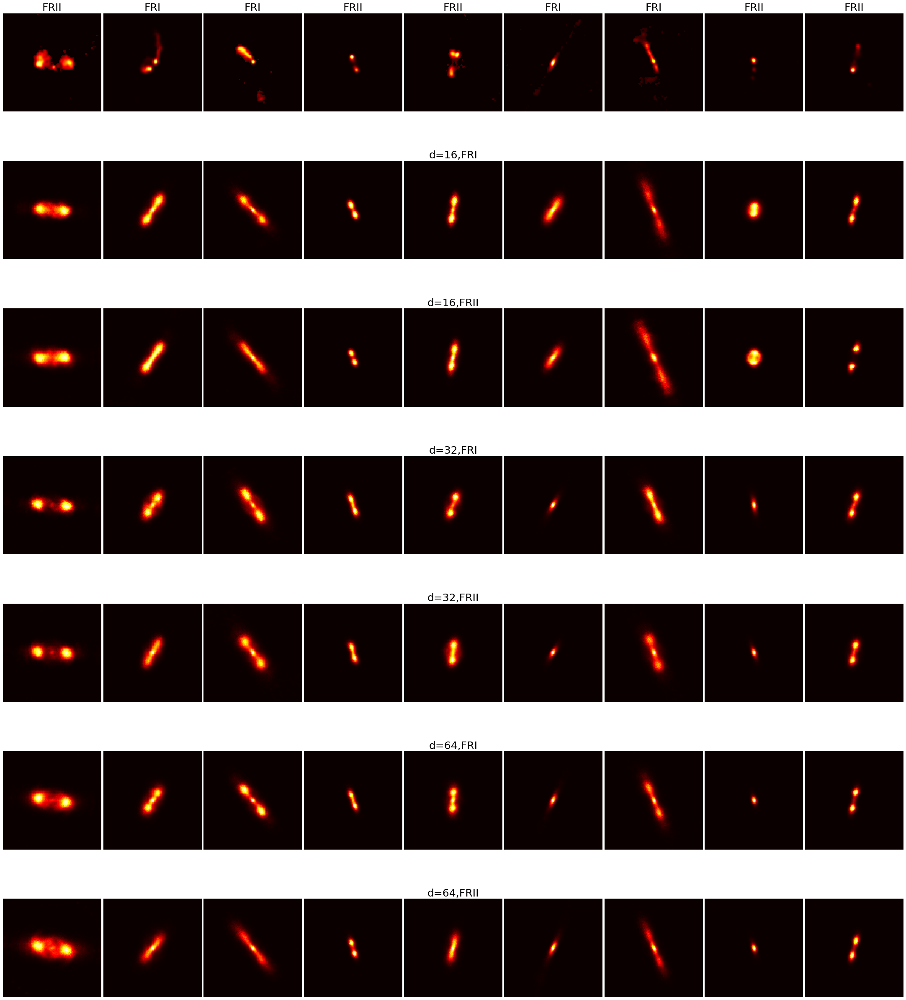

In [22]:
import matplotlib.pyplot as plt
import numpy as np

plt.figure(0)
plt.figure(figsize=(30,35))
plots = []
images = [400,403,302,202,6,60,62,67,86]
bluring_kernel = [1,5,9,13,17]
epoch = [100,200,400,800,1600,3200,5000]

directory_list=[0,'SUP-MODELS-d16-0-0009400000000000012-2020-08-23','SUP-MODELS-d32-0-000880000000000001-2020-08-24','SUP-MODELS-d64-0-0009600000000000012-2020-08-26']
epoch_list=[0,4950,4950,4950]
latent_dimensions_loop = [0,16,32,64]


for i in range(9):
    count = 0
    count_pos = 0
    image_torec = x[images[i]][0][25:125,25:125]
    for weight_out in directory_list:
            
            if weight_out == 0:
                ax = plt.subplot2grid((7,9), (count,i))
                ax.imshow(image_torec,cmap='hot')
                ax.set_axis_off()
                count = count+1
                count_pos = count_pos + 1
            else:
                print('printed_count:'+str(count))
                print(latent_dimensions_loop[count])
                print(weight_out)
                print(epoch_list[count])
                d = 2

                cvae_2 = inference_function(latent_dimensions_loop[count],weight_out,epoch_list[count])


                labels_y = torch.tensor(np.zeros((y.shape[0],2)))

                y_torch=torch.from_numpy(y).float().to("cuda:0")

                y_2=torch.Tensor.cpu(y_torch.reshape(1,y_torch.size()[0])[0]).numpy().astype(int)  

                labels_y=np.eye(2)[y_2]
                labels_y = torch.from_numpy(labels_y)

                to_rec = image_torec.reshape(10000)
                to_rec_torch=torch.from_numpy(to_rec).float().to("cuda:0")

                y_torch_real = labels_y[images[i]].reshape(1,2)

                y_torch_lab_1=labels_y[4].reshape(1,2)

                y_torch_lab_2=labels_y[5].reshape(1,2)

                [z_mean,z_sig]=cvae_2.encoder_z([to_rec_torch,y_torch_real.float().cuda()])

                x_torch_1=cvae_2.decoder([z_mean,y_torch_lab_1.float().cuda()])
                x_torch_2=cvae_2.decoder([z_mean,y_torch_lab_2.float().cuda()])

                ax = plt.subplot2grid((7,9), (count_pos,i))
                ax.imshow(x_torch_1.reshape(100,100).cpu().detach().numpy(),cmap='hot')
                ax.set_axis_off()
                count_pos = count_pos + 1
                if i == 4:
                    ax.set_title('d='+str(latent_dimensions_loop[count])+',FRI',fontsize= 25)

                ax = plt.subplot2grid((7,9), (count_pos,i))
                ax.imshow(x_torch_2.reshape(100,100).cpu().detach().numpy(),cmap='hot')
                ax.set_axis_off()
                if i == 4:
                    ax.set_title('d='+str(latent_dimensions_loop[count])+',FRII',fontsize= 25)
                count = count + 1
                count_pos = count_pos + 1
            
            if i == 0:
                if weight_out == 0 :
                    ax.set_title('FRII',fontsize= 25)
                    ax.set_ylabel('test')
            
            if i == 1:
                if weight_out == 0 :
                    ax.set_title('FRI',fontsize= 25)
            
            if i == 2:
                if weight_out == 0 :
                    ax.set_title('FRI',fontsize= 25)
            
            if i == 3:
                if weight_out == 0 :
                    ax.set_title('FRII',fontsize= 25)
            if i == 4:
                if weight_out == 0 :
                    ax.set_title('FRII',fontsize= 25)
            if i == 5:
                if weight_out == 0 :
                    ax.set_title('FRI',fontsize= 25)
            if i == 6:
                if weight_out == 0 :
                    ax.set_title('FRI',fontsize= 25)
            if i == 7:
                if weight_out == 0 :
                    ax.set_title('FRII',fontsize= 25)
            if i == 8:
                if weight_out == 0 :
                    ax.set_title('FRII',fontsize= 25)
                    
            
                    

plt.tight_layout(pad = 0.5)
plt.show()

In [51]:
images = [400,403,302,202,6,60,62,67,86]

for i in range(0,9):
    labels_y = torch.tensor(np.zeros((y.shape[0],2)))

    y_torch=torch.from_numpy(y).float().to("cuda:0")

    y_2=torch.Tensor.cpu(y_torch.reshape(1,y_torch.size()[0])[0]).numpy().astype(int)  

    labels_y=np.eye(2)[y_2]
    labels_y = torch.from_numpy(labels_y)

    to_rec = image_torec.reshape(10000)
    to_rec_torch=torch.from_numpy(to_rec).float().to("cuda:0")

    y_torch_real = labels_y[images[i]].reshape(1,2)
    print(y_torch_real)

tensor([[0., 1.]], dtype=torch.float64)
tensor([[1., 0.]], dtype=torch.float64)
tensor([[1., 0.]], dtype=torch.float64)
tensor([[0., 1.]], dtype=torch.float64)
tensor([[0., 1.]], dtype=torch.float64)
tensor([[1., 0.]], dtype=torch.float64)
tensor([[1., 0.]], dtype=torch.float64)
tensor([[0., 1.]], dtype=torch.float64)
tensor([[0., 1.]], dtype=torch.float64)


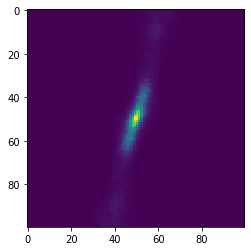

In [27]:
plt.imshow(x_torch_1.reshape(100,100).cpu().detach().numpy())

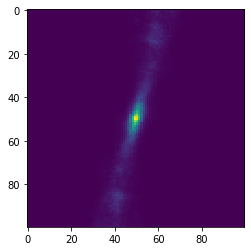

In [28]:
plt.imshow(x_torch_2.reshape(100,100).cpu().detach().numpy())

In [332]:
z = np.zeros((2,))

## Experiment 1: 
Original and reconstructed images at different latent dimensions. 1st row shows the originalimages from the train set of FRDEEP. Row 2 through 6 show the reconstructed images for $d=2,4,8,16$ and $32$


Please refer to Figure 4.9 Section 4.3.1

printed_count:1
64
1
printed_count:2
64
2
printed_count:3
64
3
printed_count:4
64
4
printed_count:5
64
5
printed_count:6
64
6
printed_count:1
64
1
printed_count:2
64
2
printed_count:3
64
3
printed_count:4
64
4
printed_count:5
64
5
printed_count:6
64
6
printed_count:1
64
1
printed_count:2
64
2
printed_count:3
64
3
printed_count:4
64
4
printed_count:5
64
5
printed_count:6
64
6


<Figure size 432x288 with 0 Axes>

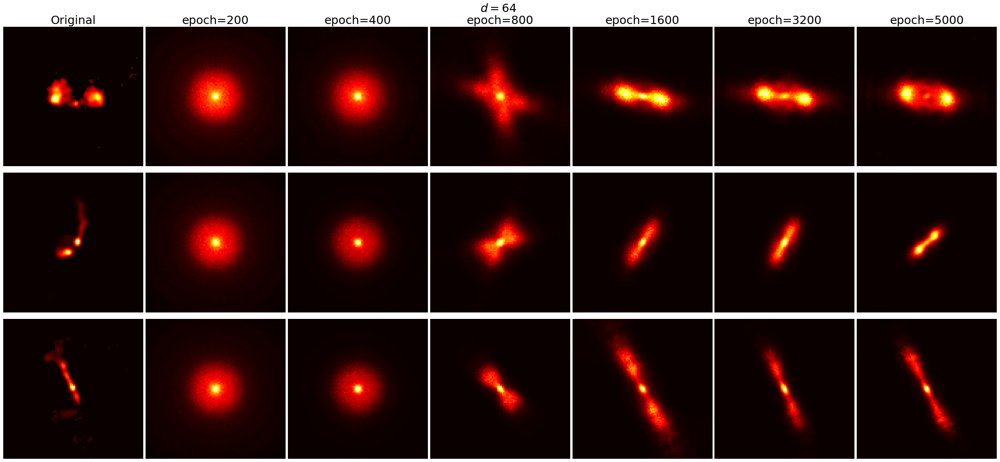

In [50]:
import matplotlib.pyplot as plt
import numpy as np




plt.figure(0)
plt.figure(figsize=(30,40))
plt.title('test')
plots = []
images = [400,403,62]
bluring_kernel = [1,5,9,13,17]
epoch = [100,200,400,800,1600,3200,5000]
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

directory_list=[0,'SUP-MODELS-d2-0-0009000000000000011-2020-08-22','SUP-MODELS-d4-0-0010800000000000015-2020-08-25','SUP-MODELS-d8-0-0009000000000000011-2020-08-23','SUP-MODELS-d16-0-0009400000000000012-2020-08-23','SUP-MODELS-d32-0-000880000000000001-2020-08-24','SUP-MODELS-d64-0-0009600000000000012-2020-08-26']


epoch_list=[0,3200,7900,7900,7900,7900]
latent_dimensions_loop = [0,2,4,8,16,32]
latent_d = 64
directory_id = 6

for i in range(3):
    count = 0
    image_torec = x[images[i]][0][25:125,25:125]
    for j in range (0,7):
            
            if j == 0:
                ax = plt.subplot2grid((9,7), (i,count))
                ax.imshow(image_torec,cmap='hot')
                ax.set_axis_off()
                count = count+1
            else:
                print('printed_count:'+str(count))
                print(latent_d)
                print(j)
                cvae_2 = inference_function(latent_d,directory_list[directory_id],epoch[j])


                labels_y = torch.tensor(np.zeros((y.shape[0],2)))

                y_torch=torch.from_numpy(y).float().to("cuda:0")

                y_2=torch.Tensor.cpu(y_torch.reshape(1,y_torch.size()[0])[0]).numpy().astype(int)  

                labels_y=np.eye(2)[y_2]
                labels_y = torch.from_numpy(labels_y)

                to_rec = image_torec.reshape(10000)
                to_rec_torch=torch.from_numpy(to_rec).float().to("cuda:0")

                y_torch_real = labels_y[images[i]].reshape(1,2)


                [z_mean,z_sig]=cvae_2.encoder_z([to_rec_torch,y_torch_real.float().cuda()])

                x_torch=cvae_2.decoder([z_mean,y_torch_real.float().cuda()])
                

                ax = plt.subplot2grid((9,7), (i,count))
                ax.imshow(x_torch.reshape(100,100).cpu().detach().numpy(),cmap='hot')
                ax.set_axis_off()
                count_pos = count_pos + 1
                count = count + 1
            
            if i == 0:
                if j == 0 :
                    ax.set_title('Original',fontsize= 25)
                else:
                    ax.set_title('epoch='+str(epoch[j]),fontsize= 25)

plt.tight_layout(pad = 0.5)

plt.figtext(0.48,0.999,'$d = '+str(latent_d)+'$',fontsize=25)
plt.show()

In [46]:
#Create the latent sample z to be used to sample the radio sources from the decoder architecture
d = 32
cvae_2 = inference_function(d,'SUP-MODELS-d32-0-000880000000000001-2020-08-24',4950)
z_fr1 = torch.randn(300, d)
z_fr2 = torch.randn(300, d)
    
    
for i in range (0,300):
    for j in range (0,d):
            z_fr1[i,j]= z_fr2[i,j] = np.random.uniform(-4,4)
            
    
labels_y1 = torch.tensor(np.zeros((300,2)))
labels_y2 = torch.tensor(np.zeros((300,2)))
        
labels_y1[:,1] = 0
labels_y2[:,1] = 0

labels_y1[:,0] = 0
labels_y2[:,0] = 0

labels_y1[:,1] = 1  #To check this in more detail so as not to create confucion
labels_y2[:,0] = 1
    
#Sample the two sets of sources
    
sample_fr1 = cvae_2.decoder([z_fr1.cuda(),labels_y1.cuda().float()])
img1=sample_fr1.reshape(300,100,100).cpu().detach().numpy()
 

sample_fr2 = cvae_2.decoder([z_fr2.cuda(),labels_y2.cuda().float()])
    
img2=sample_fr2.reshape(300,100,100).cpu().detach().numpy()


In [51]:
valid_pred = inception_classifier(sample_fr1.reshape(300,1,100,100))
m = nn.Softmax(dim=1)
values=m(valid_pred).cpu().detach().numpy()

RuntimeError: size mismatch, m1: [300 x 144], m2: [400 x 256] at /pytorch/aten/src/THC/generic/THCTensorMathBlas.cu:273

In [231]:
d = 32
cvae_2 = inference_function(d,'SUP-MODELS-d32-0-000880000000000001-2020-08-24',4950)
    #Create the latent sample z to be used to sample the radio sources from the decoder architecture
z_fr1 = torch.randn(300, d)
z_fr2 = torch.randn(300, d)

limits = np.zeros((2,d))
for i in range (0,d):
    limits[0,i]= -4
    limits[1,i]= 4    

for i in range (0,300):
    for j in range (0,d):
        z_fr1[i,j] = np.random.uniform(limits[0,j],limits[1,j])
        z_fr2[i,j] = np.random.uniform(limits[0,j],limits[1,j])
            
    #Defines the labels 
    
labels_y1 = torch.tensor(np.zeros((300,2)))
labels_y2 = torch.tensor(np.zeros((300,2)))
        
labels_y1[:,1] = 0
labels_y2[:,1] = 0

labels_y1[:,0] = 0
labels_y2[:,0] = 0

labels_y1[:,1] = 1  #To check this in more detail so as not to create confucion
labels_y2[:,0] = 1
    
    #Sample the two sets of sources
    
sample_fr1 = cvae_2.decoder([z_fr1.cuda(),labels_y1.cuda().float()])
img1=sample_fr1.reshape(300,100,100).cpu().detach().numpy()
 

sample_fr2 = cvae_2.decoder([z_fr2.cuda(),labels_y2.cuda().float()])
    
img2=sample_fr2.reshape(300,100,100).cpu().detach().numpy()

    
        
array_fr1 = np.zeros(300)
array_fr2 = np.zeros(300)

        
fullsize_image_fr1 = np.zeros((300,1,150,150))
fullsize_image_fr2 = np.zeros((300,1,150,150))


for i in range (0,300):
    fullsize_image_fr2[i,0,25:125,25:125]=img2[i,:,:]
        

    
array_generated= torch.from_numpy(fullsize_image_fr2).float().to("cpu")

valid_pred = inception_classifier(array_generated.cuda())
m = nn.Softmax(dim=1)
values=m(valid_pred).cpu().detach().numpy()
score = calculate_inception_score(values)
    
array_generated_fr1 = torch.from_numpy(fullsize_image_fr2[0:300,:,:,:]).float().to("cpu")
fr2_pred = inception_classifier(array_generated_fr1.cuda())
values=m(fr1_pred).cpu().detach().numpy()
print(values.shape)
num_fr2=len(values[values[:,0]>0.5])

(300, 2)


In [235]:
#np.save('FR2_GENERATED_D32.npy', img2)

In [471]:
img2_2 = np.load('FR2_GENERATED_D32.npy')

In [477]:
fullsize_image_fr2 = np.zeros((300,1,150,150))

for i in range (0,300):
    fullsize_image_fr2[i,0,25:125,25:125]=img2_2[i,:,:]
        

    
array_generated= torch.from_numpy(fullsize_image_fr2).float().to("cpu")

valid_pred = inception_classifier(array_generated.cuda())
m = nn.Softmax(dim=1)
values=m(valid_pred).cpu().detach().numpy()
score = calculate_inception_score(values)

print(values.shape)
num_fr2=len(values[values[:,0]>0.5])

(300, 2)


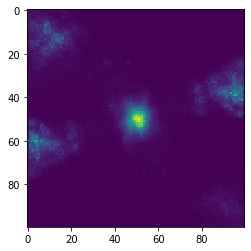

In [566]:
plt.imshow(img2_2[values[:,1]<0.4][99])

/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:60: UserWarning: The following kwargs were not used by contour: 'figsize'


<Figure size 432x288 with 0 Axes>

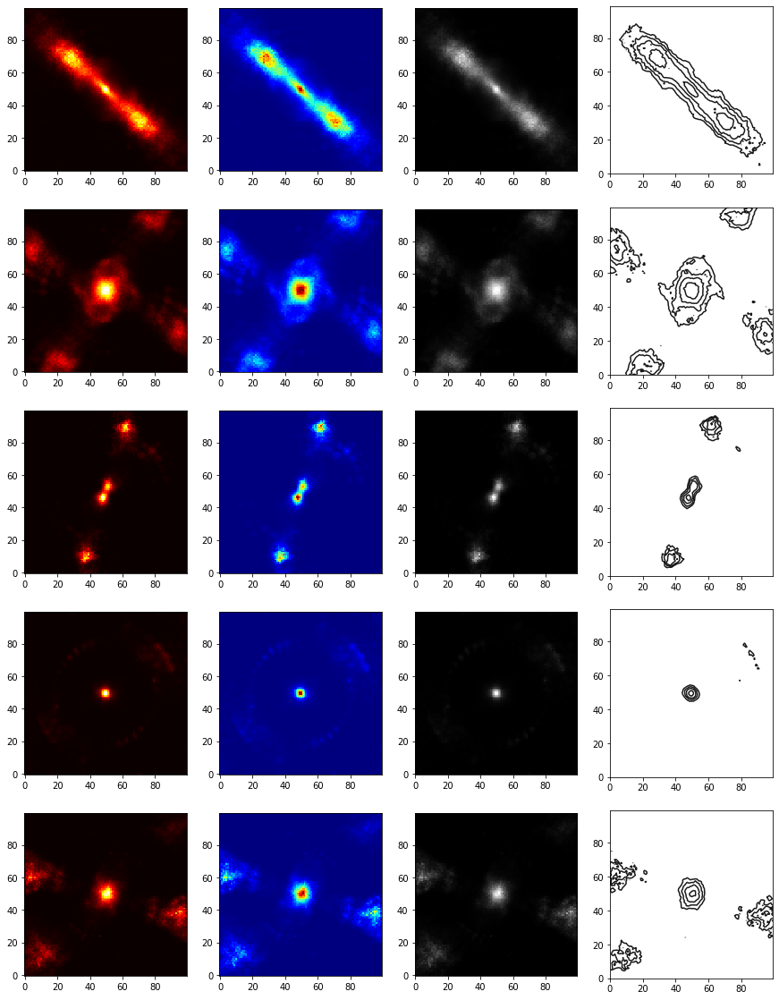

<Figure size 432x288 with 0 Axes>

In [571]:
# -----FRI-Correctly Classified----------
#source_list = [19,25,30,45,55]
#source_list = [62,66,69,71,76]
#source_list=[78,87,92,94,97]
#source_list = [81,91,106,108,115]

#-----FRII-Correctly Classified----------
#source_list = [21,90,2,30,34]
#source_list = [35,39,40,41,42]
#source_list=[43,47,52,57,59]
#source_list = [62,68,70,78,80]

#-----FRI-Incorrectly Classified----------
#source_list = [17,19,25,27,28]
#source_list = [30,32,33,38,39]
#source_list = [40,41,42,43,44]
#source_list = [46,48,52,58,65]

#-----FRII-Incorrectly Classified----------
#source_list = [10,15,20,27,33]
#source_list = [35,36,39,46,50]
#source_list = [59,64,69,75,80]
source_list = [84,85,88,96,99]

rows = 5
image_set = 0
plt.figure(0)
plt.figure(figsize=(15,rows*4))
j = 0
for source_id in source_list:
    

    image_array = img2_2[values[:,1]<0.4][source_id]
    
    ax = plt.subplot2grid((rows,4), (j,0))
    ax.imshow(image_array,origin='lower',cmap='hot')

    ax = plt.subplot2grid((rows,4), (j,1))
    ax.imshow(image_array,origin='lower',cmap='jet')


    ax = plt.subplot2grid((rows,4), (j,2))
    ax.imshow(image_array,origin='lower',cmap='gray')

    min_val = 0.005
    interval = []
    num_of_contours = 20
    initial = 5.
    for n in range (0,num_of_contours):
        interval.append(initial)
        initial = initial * 2.

    new_list =[]
    for i in range (0,len(interval)):
            new_list.append(interval[i]*min_val)
        

    ax = plt.subplot2grid((rows,4), (j,3))

    ax.contour(image_array, levels=new_list, alpha=.9,figsize = (2,10),colors='black')
        
    j = j + 1
plt.show()
plt.savefig("fr1_generated_d32_set1.pdf", bbox_inches='tight')

/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:37: UserWarning: The following kwargs were not used by contour: 'figsize'


<Figure size 432x288 with 0 Axes>

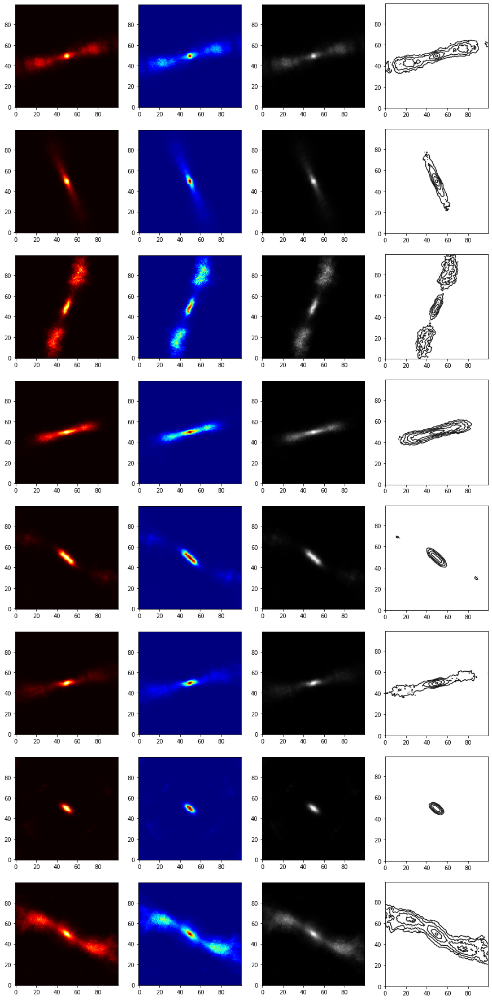

<Figure size 432x288 with 0 Axes>

In [223]:
source_list=[78,87,92,94,97,106,108,115]
rows = 8
image_set = 0
plt.figure(0)
plt.figure(figsize=(15,rows*4))
j = 0
for source_id in source_list:
    

    image_array = x_gen_fr1[values[:,0]>0.6][source_id]
    
    ax = plt.subplot2grid((rows,4), (j,0))
    ax.imshow(image_array,origin='lower',cmap='hot')

    ax = plt.subplot2grid((rows,4), (j,1))
    ax.imshow(image_array,origin='lower',cmap='jet')


    ax = plt.subplot2grid((rows,4), (j,2))
    ax.imshow(image_array,origin='lower',cmap='gray')

    min_val = 0.005
    interval = []
    num_of_contours = 20
    initial = 5.
    for n in range (0,num_of_contours):
        interval.append(initial)
        initial = initial * 2.

    new_list =[]
    for i in range (0,len(interval)):
            new_list.append(interval[i]*min_val)
        

    ax = plt.subplot2grid((rows,4), (j,3))

    ax.contour(image_array, levels=new_list, alpha=.9,figsize = (2,10),colors='black')
        
    j = j + 1
plt.show()
plt.savefig("fr1_generated_d32_set2.pdf", bbox_inches='tight')

0


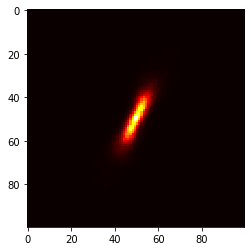

1


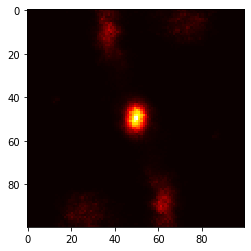

2


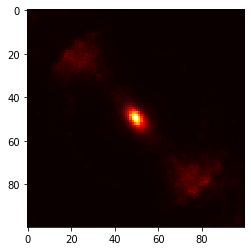

3


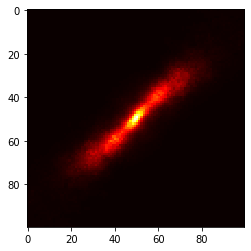

4


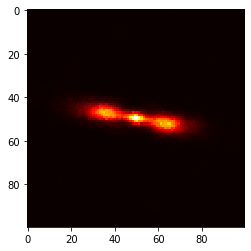

5


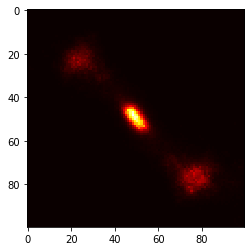

6


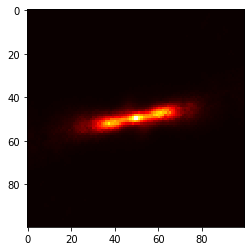

7


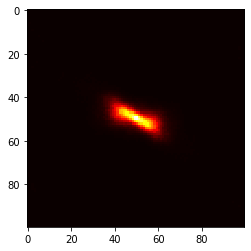

8


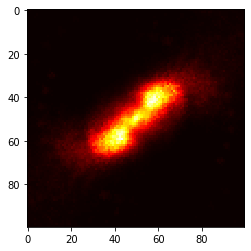

9


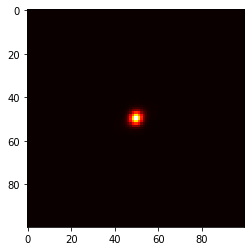

10


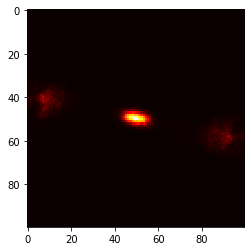

11


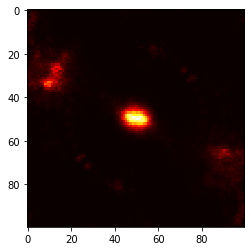

12


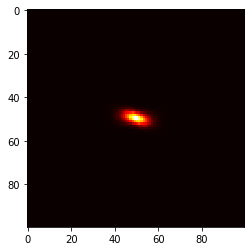

13


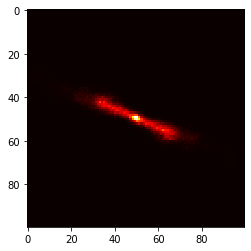

14


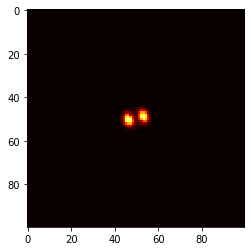

15


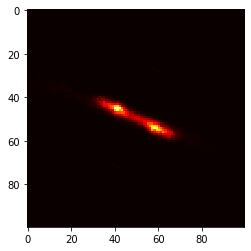

16


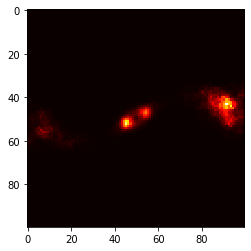

17


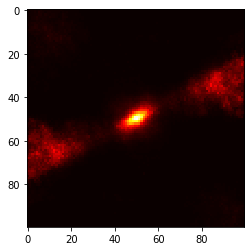

18


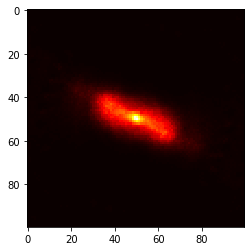

19


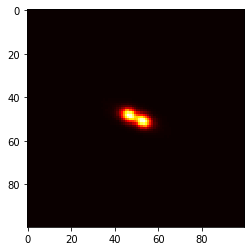

20


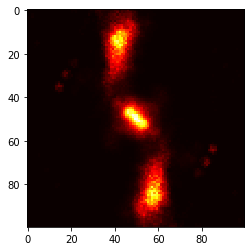

21


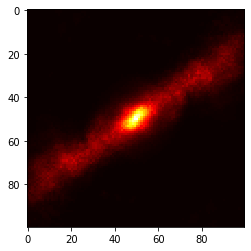

22


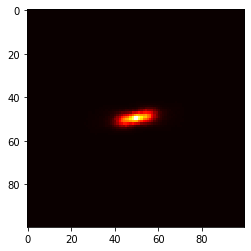

23


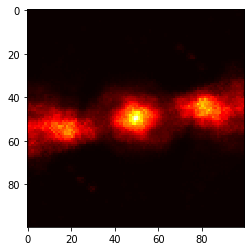

24


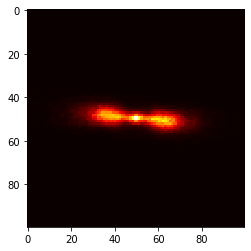

25


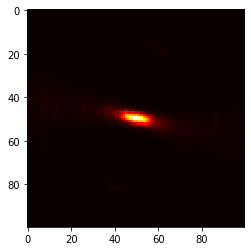

26


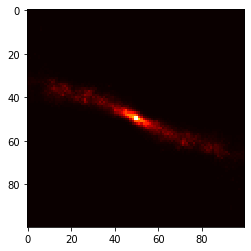

27


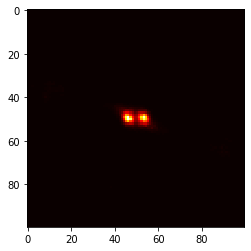

28


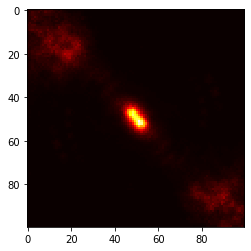

29


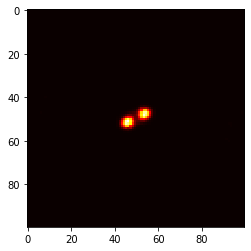

30


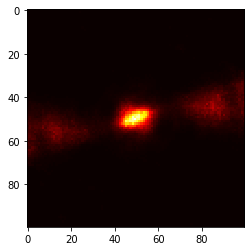

31


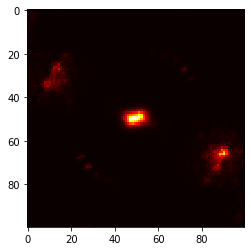

32


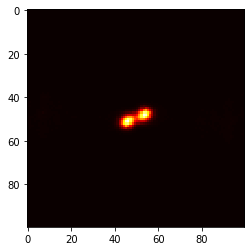

33


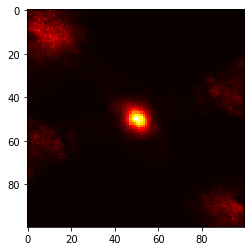

34


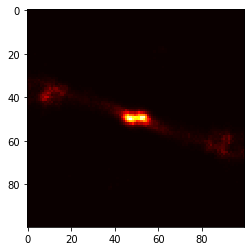

35


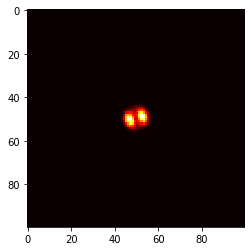

36


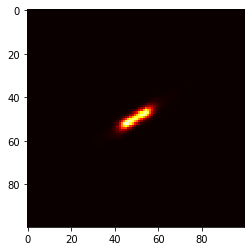

37


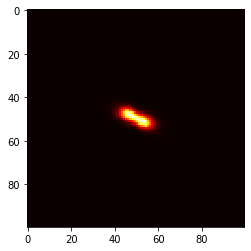

38


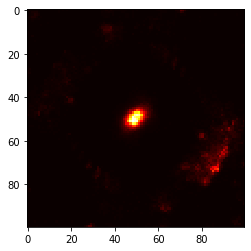

39


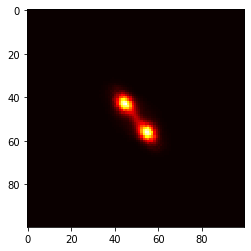

40


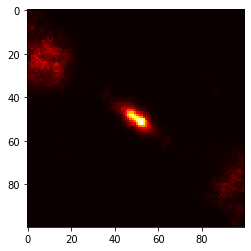

41


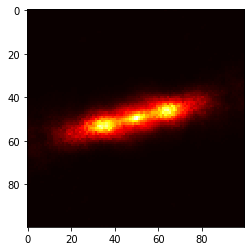

42


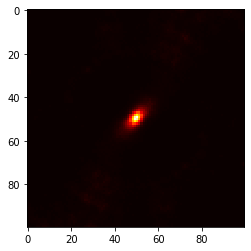

43


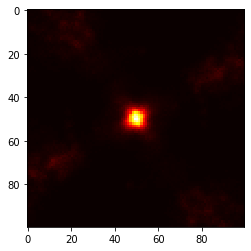

44


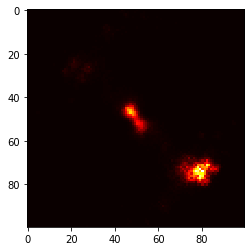

45


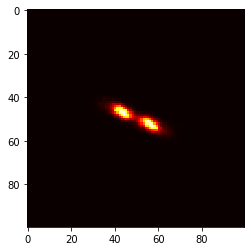

46


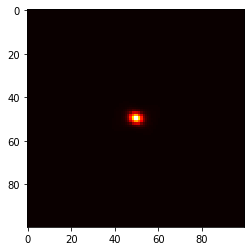

47


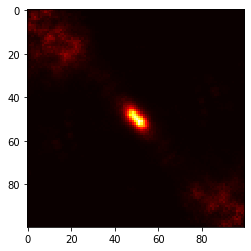

48


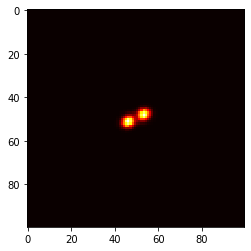

49


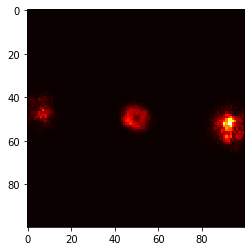

50


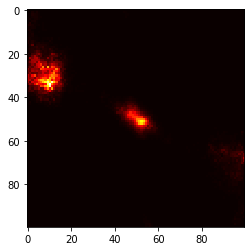

51


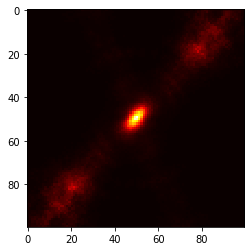

52


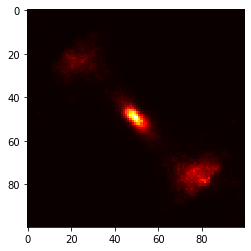

53


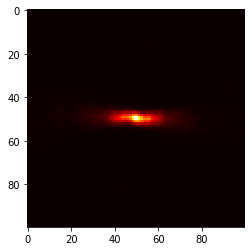

54


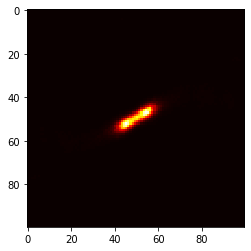

55


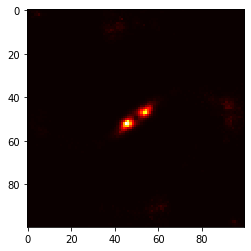

56


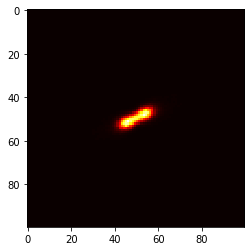

57


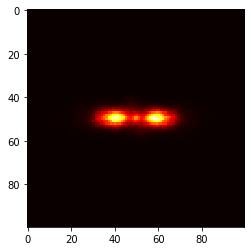

58


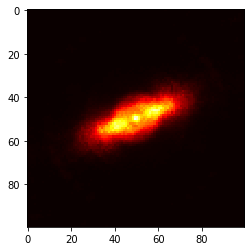

59


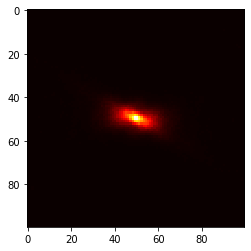

60


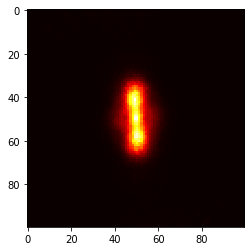

61


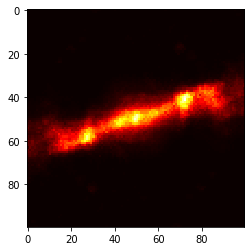

62


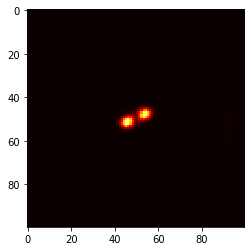

63


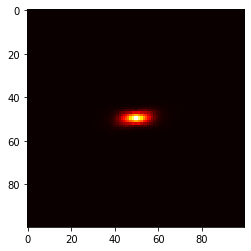

64


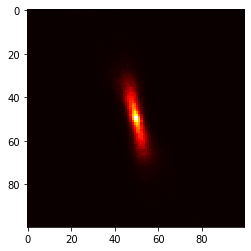

65


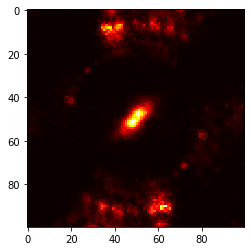

66


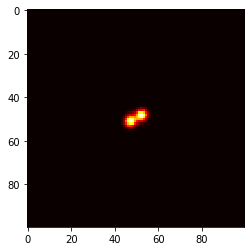

67


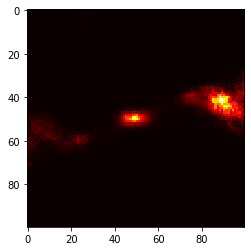

68


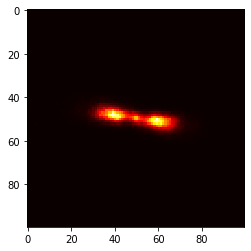

69


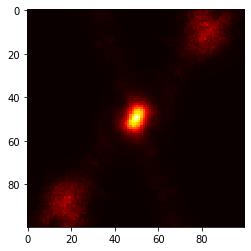

70


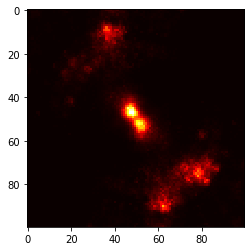

71


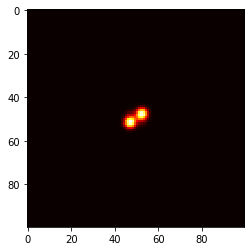

72


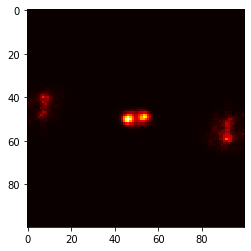

73


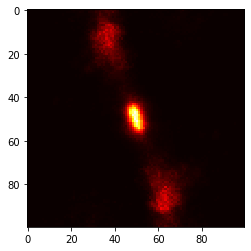

74


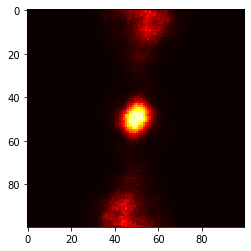

75


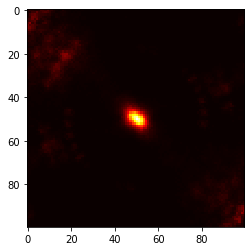

76


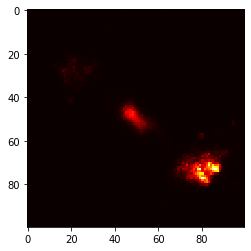

77


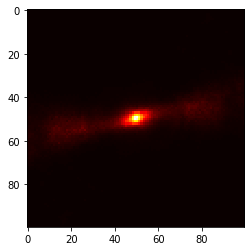

78


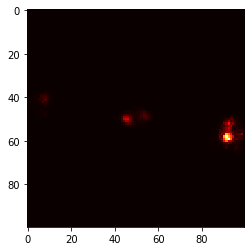

79


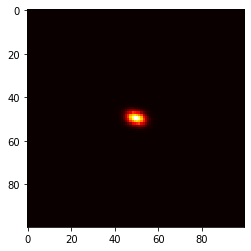

80


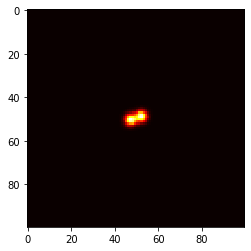

81


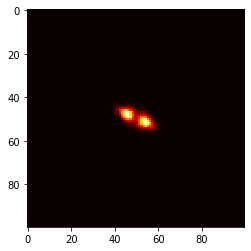

82


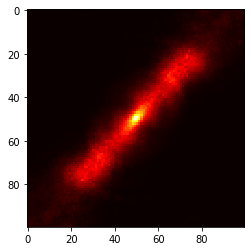

83


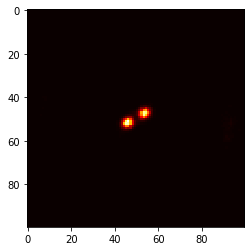

84


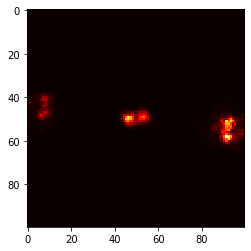

85


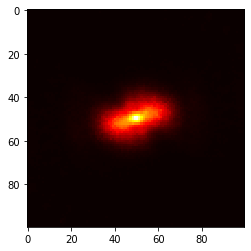

86


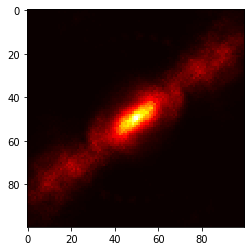

87


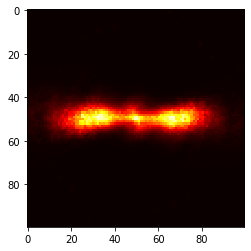

88


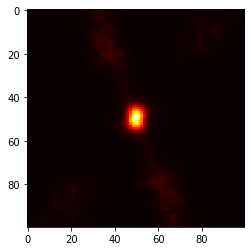

89


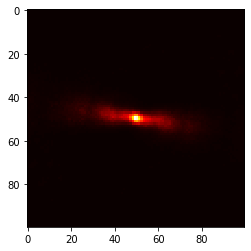

90


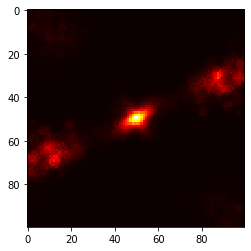

91


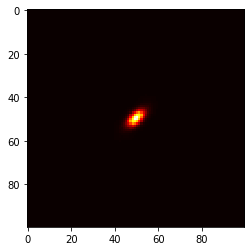

92


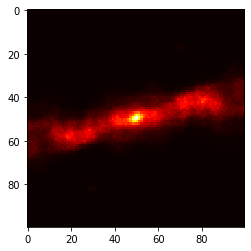

93


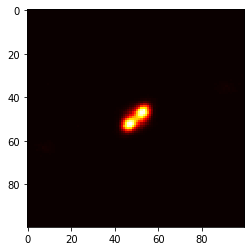

94


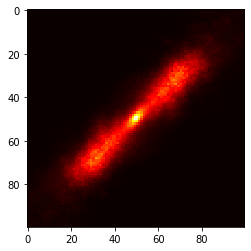

95


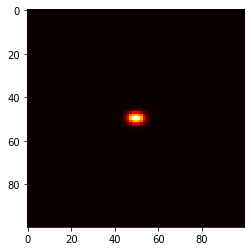

96


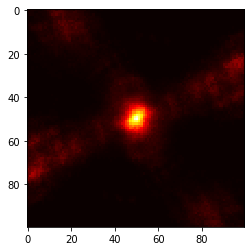

97


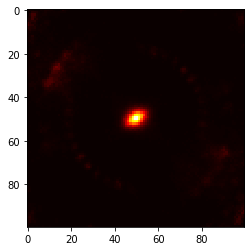

98


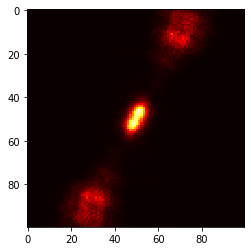

99


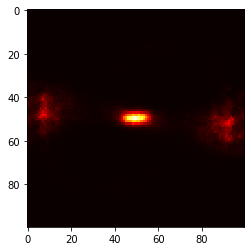

In [45]:
for i in range (0,100):
    print(i)
    plt.imshow(img1[i],cmap='hot')
    plt.show()

In [14]:
number_of_sources = 350
d = 32
cvae_2 = inference_function(d,'SUP-MODELS-d32-0-000880000000000001-2020-08-24',4950)
    #Create the latent sample z to be used to sample the radio sources from the decoder architecture
z_fr1 = torch.randn(number_of_sources, d)
z_fr2 = torch.randn(number_of_sources, d)

limits = np.zeros((2,d))
for i in range (0,d):
    limits[0,i]= -4
    limits[1,i]= 4    

for i in range (0,number_of_sources):
    for j in range (0,d):
        z_fr1[i,j] = np.random.uniform(limits[0,j],limits[1,j])
        z_fr2[i,j] = np.random.uniform(limits[0,j],limits[1,j])
            
    #Defines the labels 
    
labels_y1 = torch.tensor(np.zeros((number_of_sources,2)))
labels_y2 = torch.tensor(np.zeros((number_of_sources,2)))
        
labels_y1[:,1] = 0
labels_y2[:,1] = 0

labels_y1[:,0] = 0
labels_y2[:,0] = 0

labels_y1[:,1] = 1  #To check this in more detail so as not to create confucion
labels_y2[:,0] = 1
    
    #Sample the two sets of sources
    
sample_fr1 = cvae_2.decoder([z_fr1.cuda(),labels_y1.cuda().float()])
img1=sample_fr1.reshape(number_of_sources,100,100).cpu().detach().numpy()
 

sample_fr2 = cvae_2.decoder([z_fr2.cuda(),labels_y2.cuda().float()])
    
img2=sample_fr2.reshape(number_of_sources,100,100).cpu().detach().numpy()

    
        
array_fr1 = np.zeros(number_of_sources)
array_fr2 = np.zeros(number_of_sources)

        
fullsize_image_fr1 = np.zeros((number_of_sources,1,150,150))
fullsize_image_fr2 = np.zeros((number_of_sources,1,150,150))


for i in range (0,number_of_sources):
    fullsize_image_fr1[i,0,25:125,25:125]=img1[i,:,:]
    fullsize_image_fr2[i,0,25:125,25:125]=img2[i,:,:]
        

    
array_generated_fr1= torch.from_numpy(fullsize_image_fr1).float().to("cpu")
valid_pred_fr1 = inception_classifier(array_generated_fr1.cuda())
m = nn.Softmax(dim=1)
values_fr1=m(valid_pred_fr1).cpu().detach().numpy()
num_fr1=len(values_fr1[values_fr1[:,0]>0.5])


array_generated_fr2 = torch.from_numpy(fullsize_image_fr2).float().to("cpu")
fr2_pred = inception_classifier(array_generated_fr2.cuda())
values_fr2=m(fr2_pred).cpu().detach().numpy()
num_fr2=len(values_fr2[values_fr2[:,1]>0.5])



In [48]:
np.save('D32_CVAE_SAMPLE_SKA_1_FRII.npy', array_generated_fr2)
np.save('D32_CVAE_SAMPLE_SKA_1_FRI.npy', array_generated_fr1)

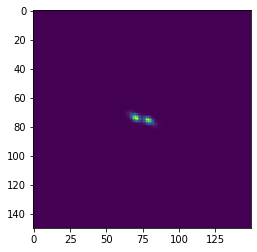

In [15]:
plt.imshow(array_generated_fr2[values_fr2[:,1]>0.5][89][0])

In [20]:
array_generated_fr2[values_fr2[:,1]<0.5].shape

torch.Size([222, 1, 150, 150])

/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_l

/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_l

/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_l

/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_l

<Figure size 432x288 with 0 Axes>

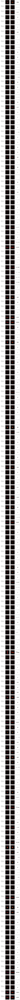

<Figure size 432x288 with 0 Axes>

In [52]:
from skimage.feature import blob_dog, blob_log, blob_doh
from math import sqrt
import math
from sklearn import datasets, linear_model
from astropy.io import fits

rows = 200
columns = 4
image_set = 0
plt.figure(0)
plt.figure(figsize=(columns*4,rows*4))
j = 0

for n in range (0,rows):
    data_image=array_generated_fr2[values_fr2[:,1]>0.3][n][0]
    blobs_dog = blob_dog(data_image.cpu().detach().numpy().astype('double'), max_sigma=1., threshold=0.005)
    blobs_dog[:, 2] = blobs_dog[:, 2] * sqrt(2)
    blobs = blobs_dog
    x_list=[]
    y_list=[]
    
    for blob in blobs:
        y, x, r = blob
        x_list.append(x)
        y_list.append(y)
        
    number_blobs = len(x_list)
    regr = linear_model.LinearRegression()

    # Train the model using the training sets
    regr.fit(np.array(x_list).reshape(-1, 1), np.array(y_list).reshape(-1, 1))

    # Make predictions using the testing set
    y_pred = regr.predict(np.array(x_list).reshape(-1, 1))
 
    image_object=Image.fromarray(data_image.cpu().detach().numpy())
    
    rotated=image_object.rotate(math.degrees(math.atan(regr.coef_[0][0])))

    
    image_array_unrot= data_image.cpu().detach().numpy()
    image_array = np.array(rotated)
    
    ax = plt.subplot2grid((rows,4), (j,0))
    ax.axis("off")
    ax.text(0.2,0.9, "Source ID:"+str(j),wrap=True)
    ax.text(0.2,0.8, "Source Name:"+'RAGA-VAE-00-'+str(image_set)+'-'+str(j)+'.fits',wrap=True)
    ax.text(0.2,0.7, "angle="+str(math.degrees(math.atan(regr.coef_[0][0]))),wrap=True)
    ax.text(0.2,0.6, "FRII_PROB="+str(values_fr2[:,1][values_fr2[:,1]>0.3][i]),wrap=True)
    

    
    ax = plt.subplot2grid((rows,4), (j,1))
    
    ax.imshow(image_array_unrot,origin='lower',cmap='hot')
    
    ax.plot(x_list,y_pred, color='blue', linewidth=3)
    ax.plot(x_list,y_list,'+',color='tab:blue')

    ax = plt.subplot2grid((rows,4), (j,2))
    ax.imshow(image_array,origin='lower',cmap='hot')

    min_val = 0.005
    interval = []
    num_of_contours = 20
    initial = 5.
    for n in range (0,num_of_contours):
        interval.append(initial)
        initial = initial * 2.

    new_list =[]
    for i in range (0,len(interval)):
            new_list.append(interval[i]*min_val)
        

    ax = plt.subplot2grid((rows,4), (j,3))

    ax.contour(image_array, levels=new_list, alpha=.9,figsize = (2,10),colors='black')
    
    file_name = 'RAGA-CVAE-SDC2-0-FRII-'+str(j)
    hdu_list = fits.open('J105007+304037.fits')

    hdu_list[0].data = image_array

    outfile = 'FITS_IMAGES_SDC2_SAMPLE1/'+file_name+'.fits'
    hdu_list.writeto(outfile, overwrite=True) 
    
    
    j = j + 1
plt.show()
plt.savefig("fr1_generated_d32_set2.pdf", bbox_inches='tight')

/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_l

/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_l

/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_l

/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:78: UserWarning: The following kwargs were not used by contour: 'figsize'
/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_l

<Figure size 432x288 with 0 Axes>

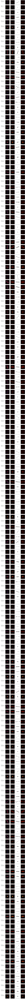

<Figure size 432x288 with 0 Axes>

In [97]:
from skimage.feature import blob_dog, blob_log, blob_doh
from math import sqrt
import math
from sklearn import datasets, linear_model
from astropy.io import fits

rows = 200
columns = 5
image_set = 0
plt.figure(0)
plt.figure(figsize=(columns*4,rows*4))
j = 0

for n in range (0,rows):
    data_image=array_generated_fr1[values_fr1[:,0]>0.3][n][0]
    blobs_dog = blob_dog(data_image.cpu().detach().numpy().astype('double'), max_sigma=1., threshold=0.001)
    blobs_dog[:, 2] = blobs_dog[:, 2] * sqrt(2)
    blobs = blobs_dog
    x_list=[]
    y_list=[]
    
    for blob in blobs:
        y, x, r = blob
        x_list.append(x)
        y_list.append(y)
        
    number_blobs = len(x_list)
    regr = linear_model.LinearRegression()

    # Train the model using the training sets
    regr.fit(np.array(x_list).reshape(-1, 1), np.array(y_list).reshape(-1, 1))

    # Make predictions using the testing set
    y_pred = regr.predict(np.array(x_list).reshape(-1, 1))
 
    image_object=Image.fromarray(data_image.cpu().detach().numpy())
    
    rotated=image_object.rotate(math.degrees(math.atan(regr.coef_[0][0])))

    
    image_array_unrot= data_image.cpu().detach().numpy()
    image_array = np.array(rotated)
    
    ax = plt.subplot2grid((rows,5), (j,0))
    ax.axis("off")
    ax.text(0.2,0.9, "Source ID:"+str(j),wrap=True)
    ax.text(0.2,0.8, "Source Name:"+'RAGA-VAE-00-'+str(image_set)+'-'+str(j)+'.fits',wrap=True)
    ax.text(0.2,0.7, "angle="+str(math.degrees(math.atan(regr.coef_[0][0]))),wrap=True)
    ax.text(0.2,0.6, "FRI_PROB="+str(values_fr1[:,0][values_fr1[:,0]>0.3][j]),wrap=True)
    

    
    ax = plt.subplot2grid((rows,5), (j,1))
    
    ax.imshow(image_array_unrot,origin='lower',cmap='hot')
    
    ax.plot(x_list,y_pred, color='blue', linewidth=3)
    ax.plot(x_list,y_list,'+',color='tab:blue')

    ax = plt.subplot2grid((rows,5), (j,2))
    ax.imshow(image_array,origin='lower',cmap='hot')

    min_val = 0.005
    interval = []
    num_of_contours = 20
    initial = 5.
    for n in range (0,num_of_contours):
        interval.append(initial)
        initial = initial * 2.

    new_list =[]
    for i in range (0,len(interval)):
            new_list.append(interval[i]*min_val)
        

    ax = plt.subplot2grid((rows,5), (j,3))

    ax.contour(image_array, levels=new_list, alpha=.9,figsize = (2,10),colors='black')
    
    file_name = 'RAGA-CVAE-SDC2-0-FRI-'+str(j)
    hdu_list = fits.open('J105007+304037.fits')

    hdu_list[0].data = image_array

    outfile = 'FITS_IMAGES_SDC2_SAMPLE1/'+file_name+'.fits'
    hdu_list.writeto(outfile, overwrite=True)
    
    mask = create_circular_mask(150,150,center=(75,75),radius=75)
    original_integration=integration=np.sum(image_array[mask])
    radius_loop=75
    while integration > 0.8 * original_integration:
        mask = create_circular_mask(150,150,center=(75,75),radius=radius_loop)
        integration=np.sum(image_array[mask])
        radius_loop = radius_loop-1


    ax = plt.subplot2grid((rows,5), (j,4))
    ax.imshow(image_array,cmap='hot')
    c = plt.Circle((75, 75), radius_loop, color='tab:red', linewidth=2, fill=False)
    ax.add_patch(c)

    
    
    j = j + 1
plt.show()
plt.savefig("fr1_generated_d32_set2.pdf", bbox_inches='tight')

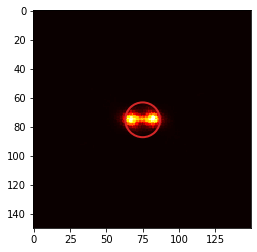

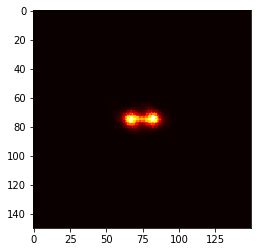

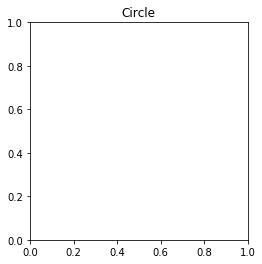

In [83]:
import matplotlib.pyplot as plt
plt.imshow(image_array,cmap='hot')
figure, axes = plt.subplots()
draw_circle = plt.Circle((75, 75), 40,fill=False)

axes.set_aspect(1)
axes.add_artist(draw_circle)
plt.title('Circle')
plt.show()

75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11


In [58]:
def create_circular_mask(h, w, center=None, radius=None):

    if center is None: # use the middle of the image
        center = (int(w/2), int(h/2))
    if radius is None: # use the smallest distance between the center and image walls
        radius = min(center[0], center[1], w-center[0], h-center[1])

    Y, X = np.ogrid[:h, :w]
    dist_from_center = np.sqrt((X - center[0])**2 + (Y-center[1])**2)

    mask = dist_from_center <= radius
    return mask

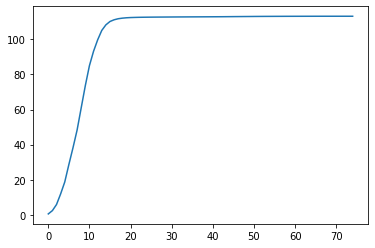

In [67]:
plt.plot(sum_list)

In [ ]:
0 1 5 9 10 13
15 18 23 24 27
32 34 35 36 37
40 42 44 45 46
52 54 55 64 66
70 71 73 88 

/usr/local/anaconda-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py:47: UserWarning: The following kwargs were not used by contour: 'figsize'


<Figure size 432x288 with 0 Axes>

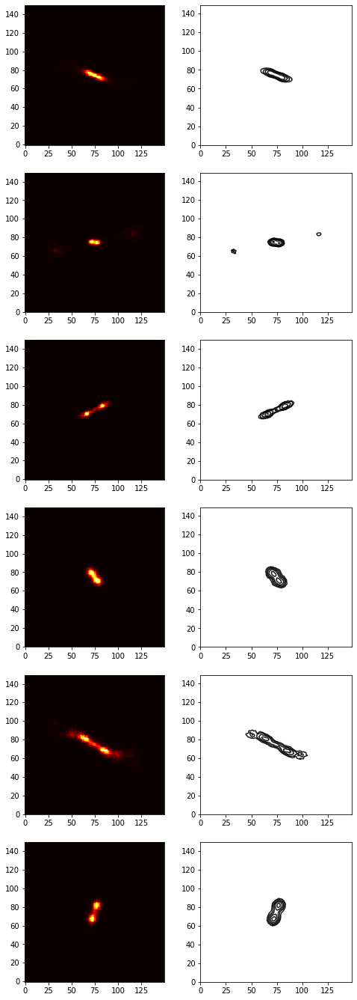

In [283]:
#source_list = [4, 6, 14, 16, 17, 21]
#source_list = [22, 24, 25, 26, 27, 29] 
#source_list = [43, 37, 38, 127, 41, 42] 
#source_list = [128, 45, 123, 51, 125, 53] 
#source_list = [54, 55, 56, 64, 66, 68] 
#source_list = [71, 73, 75, 78, 79, 80] 
#source_list = [81, 87, 97, 103, 107, 108] 
#source_list = [115, 118, , , , ] 

#source_list = [0, 1, 5, 9, 10, 13]
source_list = [15, 66, 23, 24, 27,52]
#source_list = [32, 34, 35, 36, 37,55]
#source_list = [40, 42, 44, 45, 46,64]
#source_list = [52, 54, 55, 64, ]


rows = 6
columns = 2
image_set = 0
plt.figure(0)
plt.figure(figsize=(columns*4,rows*4))
j = 0
for source_id in source_list:
    

    image_array = array_generated_fr2[values_fr2[:,1]>0.5][source_id][0]
    
    ax = plt.subplot2grid((rows,2), (j,0))
    ax.imshow(image_array,origin='lower',cmap='hot')


    min_val = 0.005
    interval = []
    num_of_contours = 20
    initial = 5.
    for n in range (0,num_of_contours):
        interval.append(initial)
        initial = initial * 2.

    new_list =[]
    for i in range (0,len(interval)):
            new_list.append(interval[i]*min_val)
        

    ax = plt.subplot2grid((rows,2), (j,1))

    ax.contour(image_array, levels=new_list, alpha=.9,figsize = (2,10),colors='black')
        
    j = j + 1
plt.show()


In [ ]:
4 6 14 16 17 21 

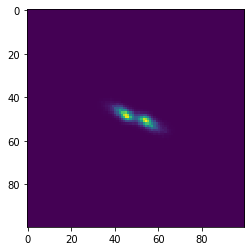

In [22]:
i=
plt.imshow(img2[i])

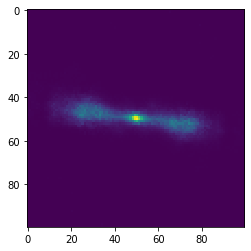

In [16]:
plt.imshow(img1[i])

In [306]:
np.save('D32_CVAE_SAMPLE2_FRI.npy', img1)

In [307]:
np.save('D32_CVAE_SAMPLE2_FRII.npy', img2)

<Figure size 432x288 with 0 Axes>

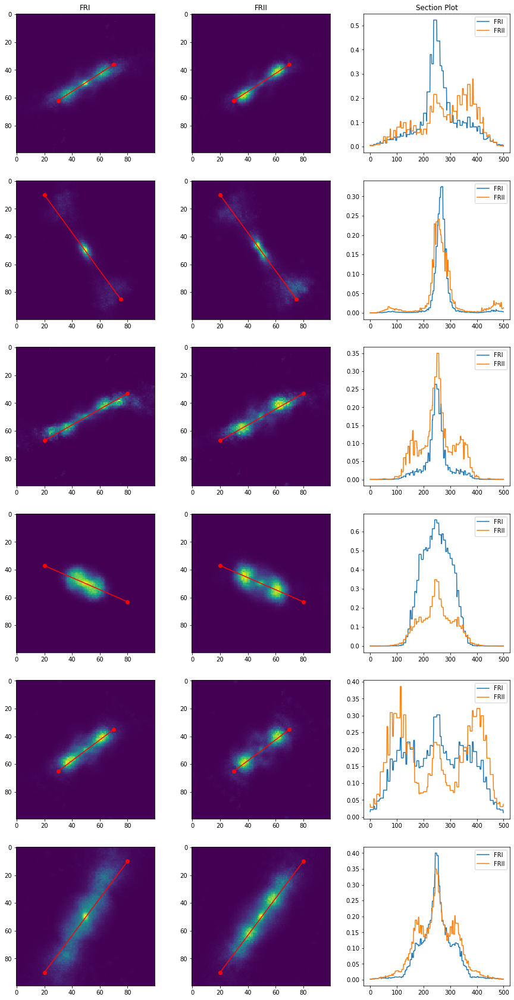

In [305]:
import numpy as np
import matplotlib.pyplot as plt

#2 8 9 10 11? 15 16 18 21 24 26!! 39

plt.figure(0)
plt.figure(figsize=(15,30))
i_list = [2,8,26,10,150,160]
x0_list = [30,20,20,20,30,20]
y0_list = [62,10,67,37,65,90]
x1_list = [70,75,80,80,70,80]
y1_list = [36,85,33,63,35,10]


for j in range (0,6):
    i = i_list[j]
    #-- Generate some data...
    x, y = np.mgrid[0:100, 0:100]

    #-- Extract the line...
    # Make a 20ne with "num" points...
    x0, y0 = x0_list[j], y0_list[j]# These are in _pixel_ coordinates!!
    x1, y1 = x1_list[j], y1_list[j]
    num = 500
    x, y = np.linspace(x0, x1, num), np.linspace(y0, y1, num)

    # Extract the values along the line
    zi = img1[i][x.astype(np.int), y.astype(np.int)]
    zi_fr1 = zi
    #-- Plot...




    ax = plt.subplot2grid((6,3), (j,0))
    ax.imshow(img1[i])
    if j == 0:
         ax.set_title('FRI',fontsize= 12)
    
    
    ax.plot([x0, x1], [y0, y1], 'ro-')

    x, y = np.linspace(x0, x1, num), np.linspace(y0, y1, num)

    # Extract the values along the line
    zi = img2[i][x.astype(np.int), y.astype(np.int)]
    zi_fr2 = zi
    #-- Plot...
    ax = plt.subplot2grid((6,3), (j,1))
    ax.imshow(img2[i])
    if j == 0:
         ax.set_title('FRII',fontsize= 12)
    
    ax.plot([x0, x1], [y0, y1], 'ro-')
    ax = plt.subplot2grid((6,3), (j,2))

    ax.plot(zi_fr1,label='FRI')
    ax.plot(zi_fr2,label='FRII')
    if j == 0:
         ax.set_title('Section Plot',fontsize= 12)
    
   
    
    
        

    ax.legend()

<Figure size 1440x1440 with 0 Axes>

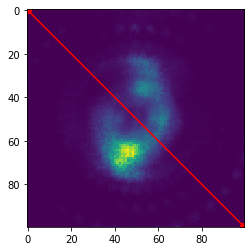

<Figure size 1440x1440 with 0 Axes>

In [159]:
x, y = np.linspace(x0, x1, num), np.linspace(y0, y1, num)

# Extract the values along the line
zi = img2[i][x.astype(np.int), y.astype(np.int)]
zi_fr2 = zi
#-- Plot...

plt.imshow(img2[i])
plt.plot([x0, x1], [y0, y1], 'ro-')
plt.figure(figsize = (20,20))

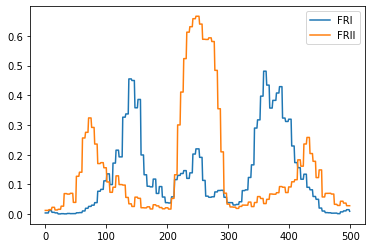

In [149]:
plt.plot(zi_fr1,label='FRI')
plt.plot(zi_fr2,label='FRII')

plt.legend()